Title: Recognition of bird species based on photos (images classification)
Dataset: [BIRDS 450 SPECIES- IMAGE CLASSIFICATION | Kaggle](https://www.kaggle.com/datasets/gpiosenka/100-bird-species)

   **Wojciech Mańczak**




### Import dataset from kaggle, and unpack it to train,valid and test folders

In [ ]:
! pip install -q kaggle
from google.colab import files
#Create New API Token on kaggle and upload it (kaggle.json) https://www.kaggle.com/general/156610
files.upload()

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d gpiosenka/100-bird-species
! unzip 100-bird-species.zip

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
  inflating: train/VIOLET TURACO/129.jpg  
  inflating: train/VIOLET TURACO/130.jpg  
  inflating: train/VIOLET TURACO/131.jpg  
  inflating: train/VIOLET TURACO/132.jpg  
  inflating: train/VIOLET TURACO/133.jpg  
  inflating: train/VIOLET TURACO/134.jpg  
  inflating: train/VIOLET TURACO/135.jpg  
  inflating: train/VIOLET TURACO/136.jpg  
  inflating: train/VIOLET TURACO/137.jpg  
  inflating: train/VIOLET TURACO/138.jpg  
  inflating: train/VIOLET TURACO/139.jpg  
  inflating: train/VIOLET TURACO/140.jpg  
  inflating: train/VIOLET TURACO/141.jpg  
  inflating: train/VIOLET TURACO/142.jpg  
  inflating: train/VIOLET TURACO/143.jpg  
  inflating: train/VIOLET TURACO/144.jpg  
  inflating: train/VIOLET TURACO/145.jpg  
  inflating: train/VIOLET TURACO/146.jpg  
  inflating: train/VIOLET TURACO/147.jpg  
  inflating: train/VIOLET TURACO/148.jpg  
  inflating: train/VIOLET TURACO/149.jpg  
  inflating: train/VIOLET TURACO

In [ ]:
#Reset variables without deleting files (used to reset dataset generation and augmentation) - skip if using first time
#%reset

In [ ]:
! pip install -U tensorboard-plugin-profile
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Convolution2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Conv2D,Dropout
from datetime import datetime
from keras.layers import BatchNormalization
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import numpy as np
import pandas as pd
import PIL
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds
import keras
from keras import backend as K
from tensorflow.keras import layers
from keras.models import load_model, Model, Sequential
from keras.preprocessing.image import ImageDataGenerator
import keras,os
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
import os
import random

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 90.3 MB/s eta 0:00:00


### Undersample folders to make sure every class has the same amount of examples (130)

In [ ]:
Nmb_files = 0

#Count number of files per class
for dirname, _, filenames in os.walk('/content/train/'):
    for filenames in filenames:
        Nmb_files += 1
print("Number of files: ",Nmb_files)

#Count number of classes
Nmb_classes = len(next(os.walk('/content/train/'))[1])
print("Number of classes: ",Nmb_classes)

Global_min = Nmb_files
Global_max = 0


#Find global max and min of files per class
for dirpath, dirnames, filenames in os.walk('/content/train/'):
    Nmb_files = len(filenames)
    if Nmb_files < Global_min and Nmb_files !=0 :
      Global_min = Nmb_files
    if Nmb_files > Global_max:
      Global_max = Nmb_files
    #print(f'Number of files in {dirpath}: {len(filenames)}')

print("Global min: ",Global_min,"Global max: ",Global_max)

#if unbalanced undersample
if Global_min != Global_max:
  print("Unbalanced Dataset!")


  print("Undersampling...")

  # Specify the directory to search
  directory = '/content/train/'

  # Specify the number of files to keep in each subfolder
  num_files_to_keep = Global_min

  # Iterate through each subfolder
  for subfolder in os.listdir(directory):
    subfolder_path = os.path.join(directory, subfolder)
    if os.path.isdir(subfolder_path):
        # Get a list of all files in the subfolder
        files = os.listdir(subfolder_path)
        # Calculate the number of files to delete
        num_files_to_delete = len(files) - num_files_to_keep
        # Delete random files from the subfolder
        for i in range(num_files_to_delete):
            random_file = random.choice(files)
            file_path = os.path.join(subfolder_path, random_file)
            os.remove(file_path)
            files.remove(random_file)

  Nmb_files = 0

  for dirname, _, filenames in os.walk('/content/train/'):
    for filenames in filenames:
        Nmb_files += 1
  print("Number of files: ",Nmb_files)

  Nmb_classes = len(next(os.walk('/content/train/'))[1])
  print("Number of classes: ",Nmb_classes)

  Global_min = Nmb_files
  Global_max = 0

  for dirpath, dirnames, filenames in os.walk('/content/train/'):
    Nmb_files = len(filenames)
    if Nmb_files < Global_min and Nmb_files !=0 :
      Global_min = Nmb_files
    if Nmb_files > Global_max:
      Global_max = Nmb_files
    #print(f'Number of files in {dirpath}: {len(filenames)}')

  print("Global min: ",Global_min,"Global max: ",Global_max)


Number of files:  70626
Number of classes:  450
Global min:  130 Global max:  248
Unbalanced Dataset!
Undersampling...
Number of files:  58500
Number of classes:  450
Global min:  130 Global max:  130


### Create datasets form files in folders

In [ ]:
train_data_dir = '/content/train/'
test_data_dir = '/content/test/'
valid_data_dir='/content/valid/'


#I decided to leave orginal image size, as it brought the best results
IMAGE_SIZE=(224 ,224 )
batch_size = 32
train_ds=tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    label_mode='int',
    image_size=IMAGE_SIZE,
    batch_size = batch_size
)

class_names=train_ds.class_names
num_classes=len(class_names)

test_ds=tf.keras.preprocessing.image_dataset_from_directory(
    test_data_dir,
    label_mode='int',
    image_size=IMAGE_SIZE,
    batch_size = batch_size
)

val_ds=tf.keras.preprocessing.image_dataset_from_directory(
    valid_data_dir,
    label_mode='int',
    image_size=IMAGE_SIZE,
    batch_size = batch_size
)

print(train_ds)
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

Found 58500 files belonging to 450 classes.
Found 2250 files belonging to 450 classes.
Found 2250 files belonging to 450 classes.
<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
(32, 224, 224, 3)
(32,)


### Draw some example photos

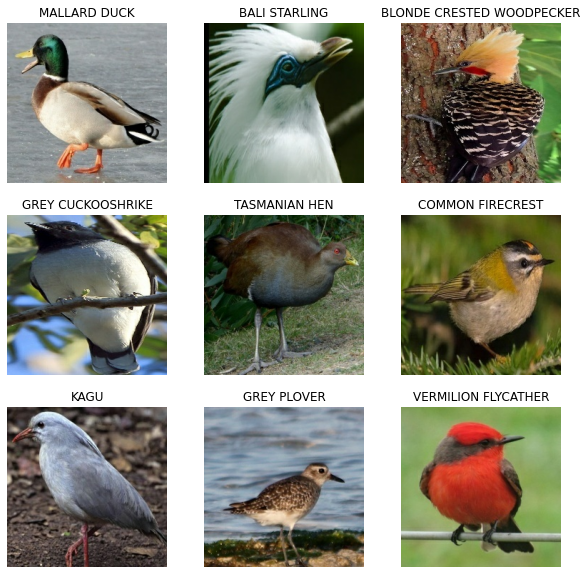

In [ ]:
import matplotlib.pyplot as plt
class_names = train_ds.class_names


plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(class_names[labels[i]])
      plt.axis("off")



### Augment

In [ ]:
print(train_ds)
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break



#During my testing no strong augmentation was needed. Despite that random zoom improved my results
trainAug = Sequential([

tf.keras.layers.RandomFlip(mode="horizontal"),
#layers.RandomRotation(0.3),
#tf.keras.layers.RandomBrightness(factor=0.1),
#tf.keras.layers.RandomContrast(factor=0.1),
tf.keras.layers.RandomZoom(height_factor = 0.2)

])

train_au_ds = train_ds.map(lambda x, y: (trainAug(x), y))





<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
(32, 224, 224, 3)
(32,)


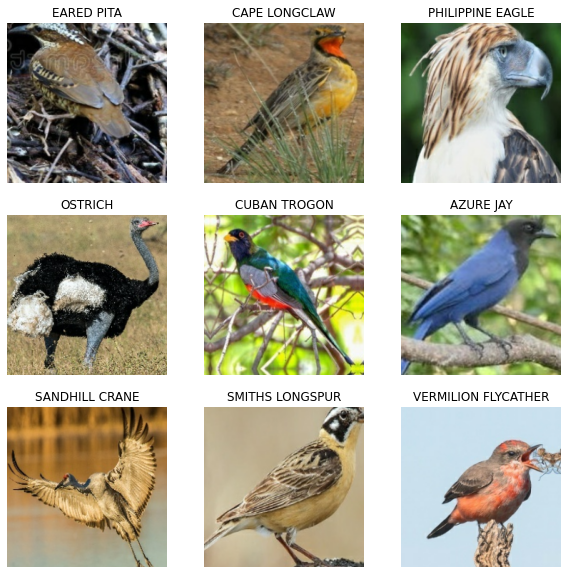

In [ ]:
plt.figure(figsize=(10, 10))

for images, labels in train_au_ds.take(1):
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(class_names[labels[i]])
      plt.axis("off")

### Normalize

Pixel values are now in [0,1]
0.0 1.0


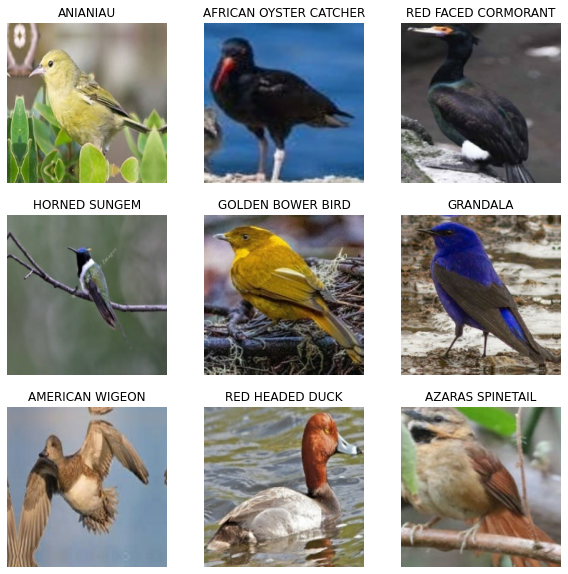

In [ ]:
data_rescale=keras.Sequential([
layers.Rescaling(1./255)
])

train_norm_ds = train_au_ds.map(lambda x, y: (data_rescale(x), y))
tes_norm_ds = test_ds.map(lambda x, y: (data_rescale(x), y))
val_norm_ds = val_ds.map(lambda x, y: (data_rescale(x), y))

image_batch, labels_batch = next(iter(train_norm_ds))
first_image = image_batch[0]

print("Pixel values are now in [0,1]")
print(np.min(first_image), np.max(first_image))


width, height = IMAGE_SIZE


plt.figure(figsize=(10, 10))
for images, labels in train_norm_ds.take(1):
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(images[i].numpy().astype("float32"))
      plt.title(class_names[labels[i]])
      plt.axis("off")

### Define model

In [ ]:
#Define modified Vgg16
model = Sequential()
model.add(Conv2D(32, kernel_size = (3, 3), activation='relu', input_shape=(224,224,3)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Conv2D(96, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Conv2D(32, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(450,activation='softmax'))

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 111, 111, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                      

In [ ]:
# Create a TensorBoard callback
logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")

tboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logs,
                                                 histogram_freq = 1,
                                                 profile_batch = '500,520')



In [ ]:
model.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), optimizer = 'adam',  metrics=['accuracy'])
#As my labels are encoded as ints (TF wiki: ->  'int': means that the labels are encoded as integers), loss function is defined as SparseCategoricalCrossentropy

### Learning

In [ ]:
train_norm_ds.cache().prefetch(tf.data.experimental.AUTOTUNE)

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
history = model.fit(train_norm_ds,epochs= 20,validation_data=val_norm_ds, callbacks = [tboard_callback])

Epoch 1/20
1829/1829 [==============================] - 440s 236ms/step - loss: 4.2372 - accuracy: 0.1634 - val_loss: 2.7992 - val_accuracy: 0.3813
Epoch 2/20
1829/1829 [==============================] - 413s 226ms/step - loss: 2.7670 - accuracy: 0.3807 - val_loss: 2.1252 - val_accuracy: 0.5093
Epoch 3/20
1829/1829 [==============================] - 415s 227ms/step - loss: 2.2779 - accuracy: 0.4748 - val_loss: 1.6959 - val_accuracy: 0.5827
Epoch 4/20
1829/1829 [==============================] - 413s 226ms/step - loss: 1.9876 - accuracy: 0.5317 - val_loss: 1.4951 - val_accuracy: 0.6427
Epoch 5/20
1829/1829 [==============================] - 413s 226ms/step - loss: 1.7984 - accuracy: 0.5677 - val_loss: 1.3311 - val_accuracy: 0.6618
Epoch 6/20
1829/1829 [==============================] - 414s 226ms/step - loss: 1.6592 - accuracy: 0.5959 - val_loss: 1.2530 - val_accuracy: 0.6809
Epoch 7/20
1829/1829 [==============================] - 413s 226ms/step - loss: 1.5579 - accuracy: 0.6152 - val_

### Test

In [ ]:
preds_test=model.evaluate(tes_norm_ds)
print("loss= "+str(preds_test[0]))
print("test accuracy= "+str(round(preds_test[1]*100,2))+"%")

71/71 [==============================] - 3s 38ms/step - loss: 0.7493 - accuracy: 0.8022
loss= 0.7492624521255493
test accuracy= 80.22%


In [ ]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [ ]:
# Launch TensorBoard and navigate to the Profile tab to view performance profile
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

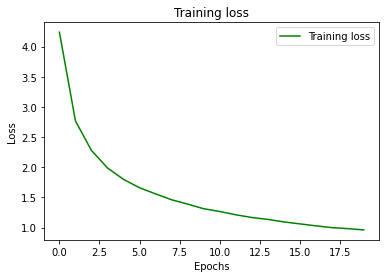

In [ ]:
plt.plot(history.epoch, history.history["loss"], 'g', label='Training loss')
plt.title('Training loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

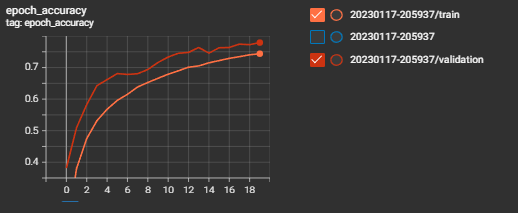

In [ ]:
!mkdir -p saved_model
model.save('saved_model/my_model')

In [ ]:
!zip -r /content/saved_model.zip '/content/saved_model'


from google.colab import files
files.download("/content/saved_model.zip")

  adding: content/saved_model/ (stored 0%)
  adding: content/saved_model/my_model/ (stored 0%)
  adding: content/saved_model/my_model/keras_metadata.pb (deflated 94%)
  adding: content/saved_model/my_model/saved_model.pb (deflated 90%)
  adding: content/saved_model/my_model/assets/ (stored 0%)
  adding: content/saved_model/my_model/variables/ (stored 0%)
  adding: content/saved_model/my_model/variables/variables.index (deflated 74%)
  adding: content/saved_model/my_model/variables/variables.data-00000-of-00001 (deflated 9%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>